In [1]:
from datasets import Dataset, DatasetDict, Image
import os
import random

# Define
dataset_name = "PKLOT" # ACPDS | PKLOT
train_ratio = 0.6
test_ratio = 0.3

d:\MS\CS 6384.001 - Computer Vision - S25\Parking-Space-Detection\.venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
dataset_root = f"./data/{dataset_name}/{dataset_name}"
image_dir = os.path.join(dataset_root, "images")
mask_dir = os.path.join(dataset_root, "int_masks")

image_paths = sorted([
    os.path.join(image_dir, f)
    for f in os.listdir(image_dir)
    if f.endswith(".jpg")
])

label_paths = sorted([
    os.path.join(mask_dir, f.replace(".jpg", ".png"))
    for f in os.listdir(image_dir)
    if f.endswith(".jpg")
])

# Shuffle together to preserve mapping
combined = list(zip(image_paths, label_paths))
random.seed(42)  # for reproducibility
random.shuffle(combined)

train_size = int(len(combined)*train_ratio)
test_size = int(len(combined)*test_ratio)
val_size = len(combined) - train_size - test_size

train_split = combined[:train_size]
test_split = combined[train_size:train_size + test_size]
val_split = combined[train_size + test_size:]

# Unzip back
train_imgs, train_masks = zip(*train_split)
test_imgs, test_masks = zip(*test_split)
val_imgs, val_masks = zip(*val_split)

def create_dataset(image_paths, label_paths):
    dataset = Dataset.from_dict({
        "image": image_paths,
        "label": label_paths
    })
    dataset = dataset.cast_column("image", Image())
    dataset = dataset.cast_column("label", Image())
    return dataset

dataset = DatasetDict({
    "train": create_dataset(train_imgs, train_masks),
    "test": create_dataset(test_imgs, test_masks),
    "validation": create_dataset(val_imgs, val_masks)
})

dataset

DatasetDict({
    train: Dataset({
        features: ['image', 'label'],
        num_rows: 7449
    })
    test: Dataset({
        features: ['image', 'label'],
        num_rows: 3724
    })
    validation: Dataset({
        features: ['image', 'label'],
        num_rows: 1243
    })
})

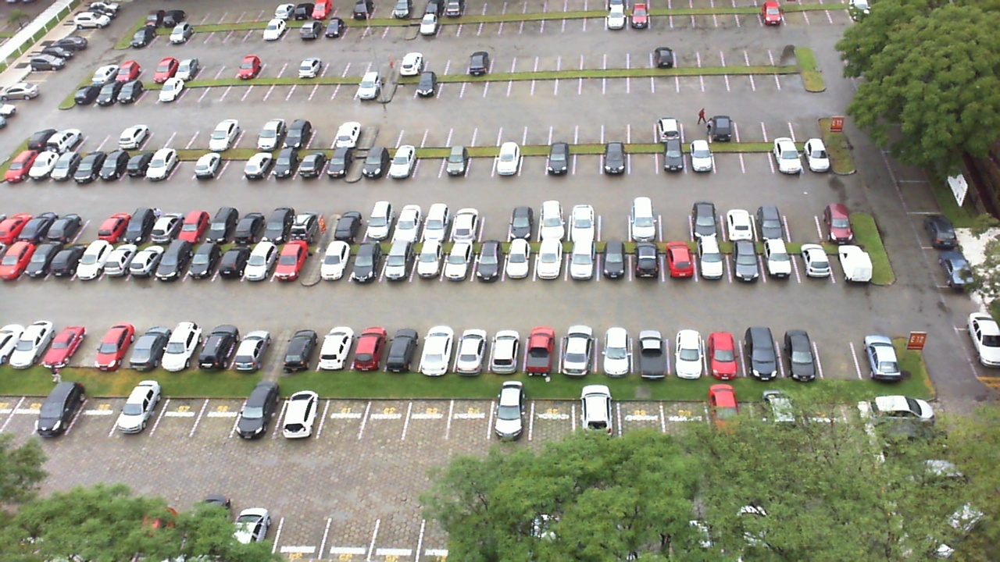

In [3]:
example = dataset["train"][0]
image = example["image"]
image

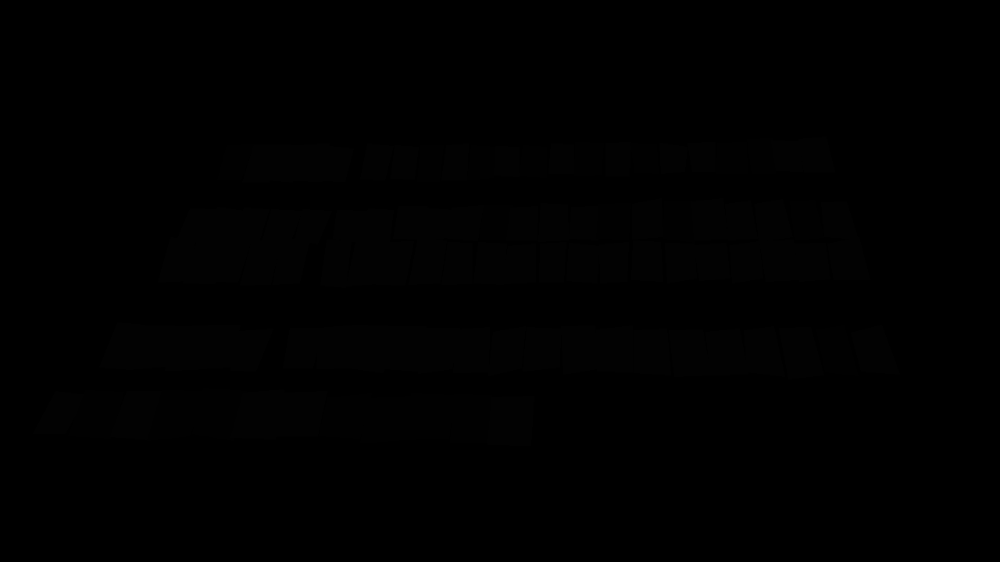

In [4]:
segmentation_map = example["label"]
segmentation_map

In [5]:
import numpy as np

segmentation_map = np.array(segmentation_map)
segmentation_map

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], shape=(720, 1280), dtype=uint8)

In [6]:
id2label = {
    0: "background",
    1: "free",
    2: "occupied"
}
print(id2label)

{0: 'background', 1: 'free', 2: 'occupied'}


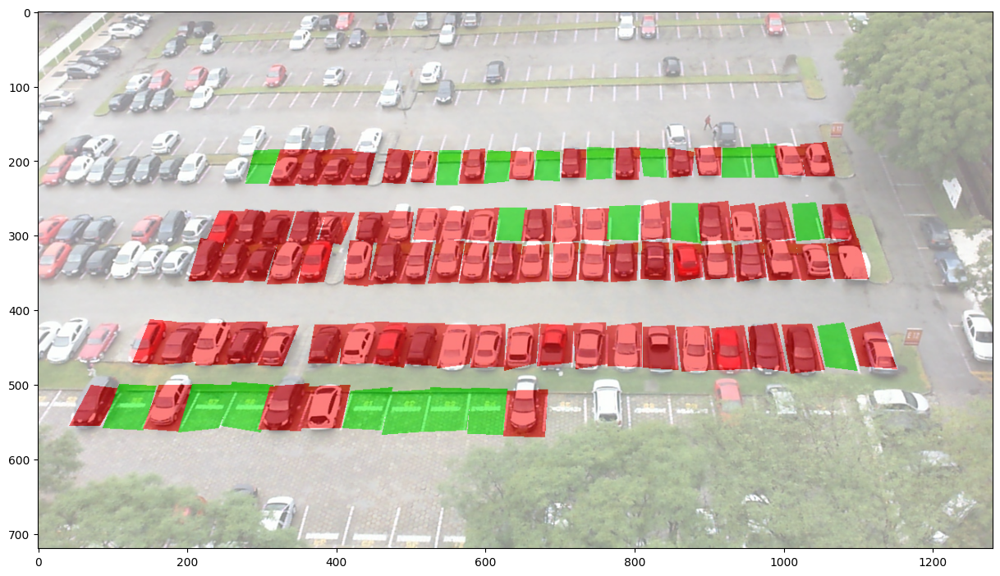

In [7]:
import numpy as np
import matplotlib.pyplot as plt

id2color = {
    0: (255,255,255),
    1: (0,255,0),
    2: (255,0,0)
}

def visualize_map(image, segmentation_map):
    color_seg = np.zeros((segmentation_map.shape[0], segmentation_map.shape[1], 3), dtype=np.uint8) # height, width, 3
    for label, color in id2color.items():
        color_seg[segmentation_map == label, :] = color

    # Show image + mask
    img = np.array(image) * 0.5 + color_seg * 0.5
    img = img.astype(np.uint8)

    plt.figure(figsize=(15, 10))
    plt.imshow(img)
    plt.show()

visualize_map(image, segmentation_map)

In [8]:
from torch.utils.data import Dataset
import torch
import numpy as np
from torchvision import transforms
import torchvision.transforms.functional as VF
from torchvision.transforms import InterpolationMode

ADE_MEAN = np.array([123.675, 116.280, 103.530]) / 255
ADE_STD = np.array([58.395, 57.120, 57.375]) / 255

class SegmentationDataset(Dataset):
    def __init__(self, dataset, resize_size=(448, 448)):
        self.dataset = dataset
        self.resize_size = resize_size
        self.normalize = transforms.Normalize(mean=ADE_MEAN, std=ADE_STD)

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        item = self.dataset[idx]
        og_image = np.array(item["image"])
        og_mask = np.array(item["label"])

        # Convert image to tensor
        image = VF.to_tensor(og_image)  # [C, H, W], scaled to [0, 1]
        mask = torch.from_numpy(og_mask).long()  # [H, W] with class IDs

        # Resize
        image = VF.resize(image, self.resize_size, interpolation=InterpolationMode.BILINEAR)
        mask = VF.resize(mask.unsqueeze(0), self.resize_size, interpolation=InterpolationMode.NEAREST).squeeze(0)

        # Normalize
        image = self.normalize(image)

        return image, mask, og_image, og_mask

In [9]:
train_dataset = SegmentationDataset(dataset["train"])
val_dataset = SegmentationDataset(dataset["validation"])
test_dataset = SegmentationDataset(dataset["test"])

In [10]:
pixel_values, target, original_image, original_segmentation_map = train_dataset[3]
print(pixel_values.shape)
print(target.shape)

torch.Size([3, 448, 448])
torch.Size([448, 448])


In [11]:
pixel_values_val, target_val, original_image_val, original_segmentation_map_val = val_dataset[3]
print(pixel_values_val.shape)
print(target_val.shape)

torch.Size([3, 448, 448])
torch.Size([448, 448])


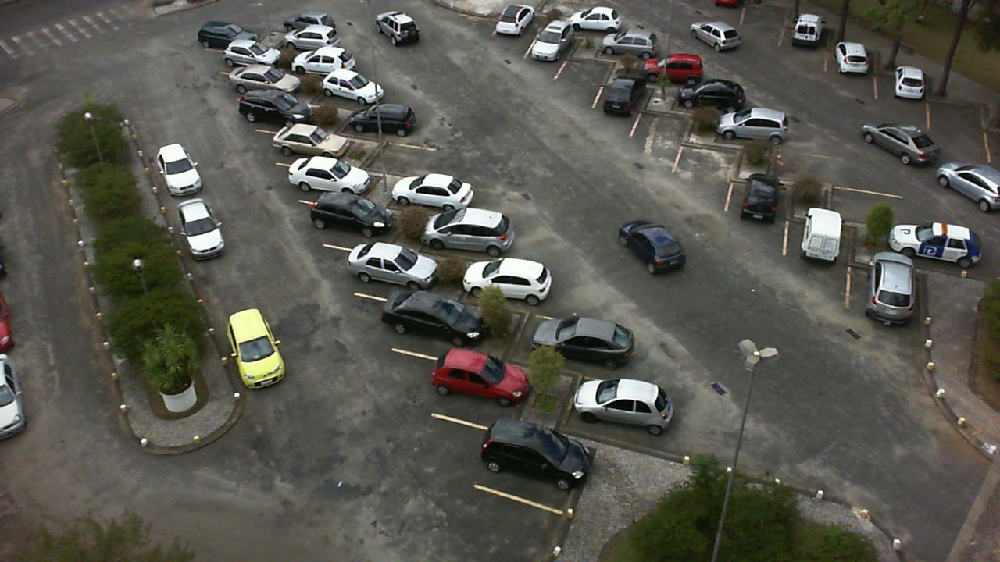

In [12]:
from PIL import Image

Image.fromarray(original_image)

In [13]:
[id2label[id] for id in np.unique(original_segmentation_map).tolist()]

['background', 'free', 'occupied']

In [14]:
from torch.utils.data import DataLoader

def collate_fn(inputs):
    batch = dict()
    batch["pixel_values"] = torch.stack([i[0] for i in inputs], dim=0)
    batch["labels"] = torch.stack([i[1] for i in inputs], dim=0)
    batch["original_images"] = [i[2] for i in inputs]
    batch["original_segmentation_maps"] = [i[3] for i in inputs]

    return batch

from torch.utils.data import DataLoader

def collate_fn(inputs):
    batch = dict()
    batch["pixel_values"] = torch.stack([i[0] for i in inputs], dim=0)
    batch["labels"] = torch.stack([i[1] for i in inputs], dim=0)
    batch["original_images"] = [i[2] for i in inputs]
    batch["original_segmentation_maps"] = [i[3] for i in inputs]

    return batch

train_dataloader = DataLoader(train_dataset, batch_size=3, shuffle=True, collate_fn=collate_fn)
val_dataloader = DataLoader(val_dataset, batch_size=3, shuffle=False, collate_fn=collate_fn)
test_dataloader = DataLoader(test_dataset, batch_size=3, shuffle=True, collate_fn=collate_fn)

In [15]:
batch = next(iter(train_dataloader))
for k,v in batch.items():
  if isinstance(v,torch.Tensor):
    print(k,v.shape)

pixel_values torch.Size([3, 3, 448, 448])
labels torch.Size([3, 448, 448])


In [16]:
batch["pixel_values"].dtype

torch.float32

In [17]:
batch["labels"].dtype

torch.int64

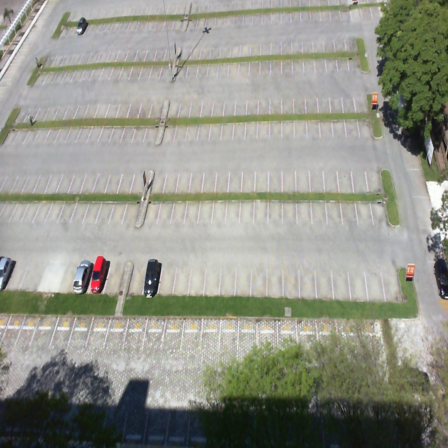

In [18]:
from PIL import Image

unnormalized_image = (batch["pixel_values"][0].numpy() * np.array(ADE_STD)[:, None, None]) + np.array(ADE_MEAN)[:, None, None]
unnormalized_image = (unnormalized_image * 255).astype(np.uint8)
unnormalized_image = np.moveaxis(unnormalized_image, 0, -1)
unnormalized_image = Image.fromarray(unnormalized_image)
unnormalized_image

In [19]:
[id2label[id] for id in torch.unique(batch["labels"][0]).tolist()]

['background', 'free', 'occupied']

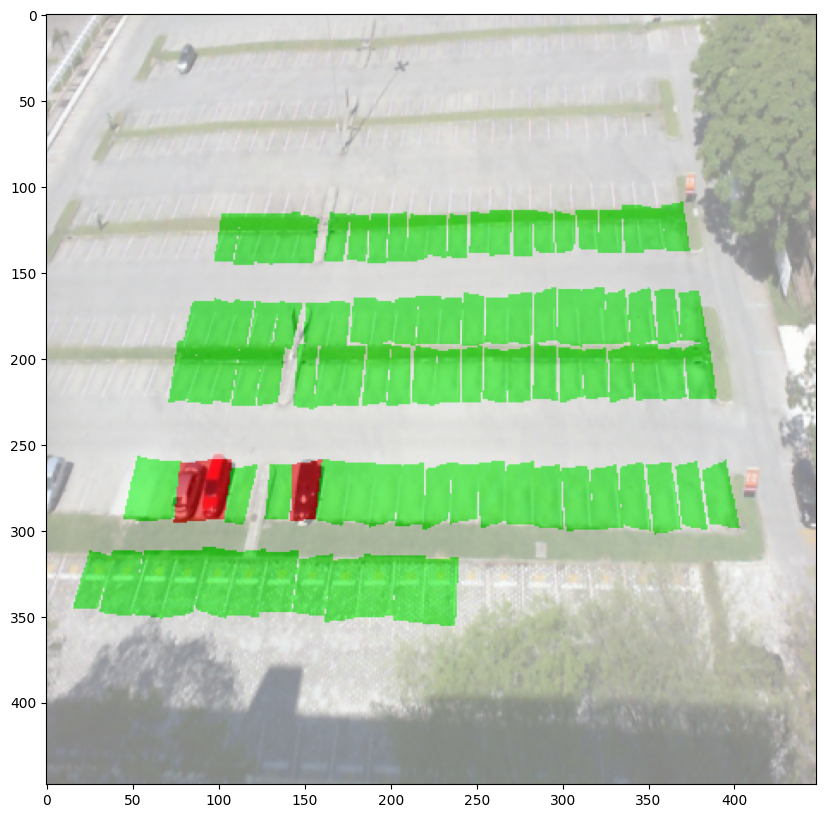

In [20]:
visualize_map(unnormalized_image, batch["labels"][0].numpy())

In [21]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from transformers import Dinov2Model, Dinov2PreTrainedModel
from transformers.modeling_outputs import SemanticSegmenterOutput

# Simplified SegFormer-style Head
class SegFormerHead(nn.Module):
    def __init__(self, in_channels, hidden_size, num_classes):
        super().__init__()
        self.linear = nn.Sequential(
            nn.Conv2d(in_channels, hidden_size, kernel_size=1),
            nn.ReLU(),
            nn.BatchNorm2d(hidden_size)
        )
        self.dropout = nn.Dropout(0.1)
        self.classifier = nn.Conv2d(hidden_size, num_classes, kernel_size=1)

    def forward(self, x, height, width):
        B, N, C = x.shape
        h = w = int(N ** 0.5)
        x = x.view(B, h, w, C).permute(0, 3, 1, 2)  # [B, C, H, W]
        x = self.linear(x)                          # [B, hidden_size, H, W]
        x = self.dropout(x)
        x = self.classifier(x)                      # [B, num_classes, H, W]
        x = F.interpolate(x, size=(height, width), mode="bilinear", align_corners=False)
        return x

# Your main segmentation model using Dinov2 + custom head
class Dinov2ForSemanticSegmentation(Dinov2PreTrainedModel):
    def __init__(self, config):
        super().__init__(config)
        self.dinov2 = Dinov2Model(config)
        self.classifier = SegFormerHead(
            in_channels=config.hidden_size,
            hidden_size=256,
            num_classes=config.num_labels
        )

    def forward(self, pixel_values, output_hidden_states=False, output_attentions=False, labels=None):
        outputs = self.dinov2(pixel_values,
                              output_hidden_states=output_hidden_states,
                              output_attentions=output_attentions)

        # Drop CLS token
        patch_embeddings = outputs.last_hidden_state[:, 1:, :]  # [B, N-1, C]

        # Classifier head
        logits = self.classifier(
            patch_embeddings,
            height=pixel_values.shape[2],
            width=pixel_values.shape[3]
        )

        loss = None
        if labels is not None:
            loss_fct = nn.CrossEntropyLoss()
            loss = loss_fct(logits, labels)

        return SemanticSegmenterOutput(
            loss=loss,
            logits=logits,
            hidden_states=outputs.hidden_states,
            attentions=outputs.attentions,
        )


In [22]:
model = Dinov2ForSemanticSegmentation.from_pretrained("facebook/dinov2-base", id2label=id2label, num_labels=len(id2label))

Some weights of Dinov2ForSemanticSegmentation were not initialized from the model checkpoint at facebook/dinov2-base and are newly initialized: ['classifier.classifier.bias', 'classifier.classifier.weight', 'classifier.linear.0.bias', 'classifier.linear.0.weight', 'classifier.linear.2.bias', 'classifier.linear.2.num_batches_tracked', 'classifier.linear.2.running_mean', 'classifier.linear.2.running_var', 'classifier.linear.2.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [23]:
# Freeze dinov2
for name, param in model.named_parameters():
  if name.startswith("dinov2"):
    param.requires_grad = False

In [24]:
outputs = model(pixel_values=batch["pixel_values"], labels=batch["labels"])
print(outputs.logits.shape)
print(outputs.loss)

torch.Size([3, 3, 448, 448])
tensor(1.0986, grad_fn=<NllLoss2DBackward0>)


In [25]:
import evaluate
metric = evaluate.load("mean_iou")

In [27]:
# === Training Cell with Epoch-wise Metric Tracking ===

from torch.optim import AdamW
from tqdm.auto import tqdm
from transformers import get_scheduler
from torchmetrics.classification import MulticlassF1Score, MulticlassRecall, MulticlassPrecision
from torchmetrics import MeanMetric, Accuracy, JaccardIndex
import torch

# === Hyperparameters ===
learning_rate = 1e-3
epochs = 10
num_classes = len(id2label)

# === Move model to GPU ===
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# === Optimizer & Scheduler ===
optimizer = AdamW(model.parameters(), lr=learning_rate)
num_training_steps = len(train_dataloader) * epochs

lr_scheduler = get_scheduler(
    "linear",
    optimizer=optimizer,
    num_warmup_steps=int(0.1 * num_training_steps),
    num_training_steps=num_training_steps
)

# === Metric Logs ===
train_loss_list, train_iou_list, train_acc_list, train_f1_list = [], [], [], []
train_recall_list, train_precision_list = [], []
val_loss_list, val_iou_list, val_acc_list, val_f1_list = [], [], [], []
val_recall_list, val_precision_list = [], []

# === Validation Evaluation Function ===
def evaluate_on_validation(model, dataloader, device, num_classes):
    model.eval()
    f1 = MulticlassF1Score(num_classes=num_classes, average='macro').to(device)
    recall = MulticlassRecall(num_classes=num_classes, average='macro').to(device)
    precision = MulticlassPrecision(num_classes=num_classes, average='macro').to(device)
    acc = Accuracy(task="multiclass", num_classes=num_classes).to(device)
    iou = JaccardIndex(task="multiclass", num_classes=num_classes).to(device)
    loss_avg = MeanMetric().to(device)
    with torch.no_grad():
        for batch in dataloader:
            pixel_values = batch["pixel_values"].to(device)
            labels = batch["labels"].to(device)
            outputs = model(pixel_values, labels=labels)
            predicted = outputs.logits.argmax(dim=1)
            loss_avg.update(outputs.loss)
            f1.update(predicted, labels)
            recall.update(predicted, labels)
            precision.update(predicted, labels)
            acc.update(predicted, labels)
            iou.update(predicted, labels)
    return {
        'loss': loss_avg.compute().item(),
        'iou': iou.compute().item(),
        'accuracy': acc.compute().item(),
        'f1': f1.compute().item(),
        'recall': recall.compute().item(),
        'precision': precision.compute().item()
    }

# === Training Loop ===
model.train()
for epoch in range(epochs):
    print(f"\nEpoch {epoch+1}/{epochs}")

    # Reset metrics
    f1_metric = MulticlassF1Score(num_classes=num_classes, average='macro').to(device)
    recall_metric = MulticlassRecall(num_classes=num_classes, average='macro').to(device)
    precision_metric = MulticlassPrecision(num_classes=num_classes, average='macro').to(device)
    mean_iou_metric = JaccardIndex(task="multiclass", num_classes=num_classes).to(device)
    accuracy_metric = Accuracy(task="multiclass", num_classes=num_classes).to(device)
    loss_metric = MeanMetric().to(device)

    for batch in tqdm(train_dataloader, desc="Training"):
        pixel_values = batch["pixel_values"].to(device)
        labels = batch["labels"].to(device)

        # Forward
        outputs = model(pixel_values, labels=labels)
        loss = outputs.loss
        logits = outputs.logits
        predicted = logits.argmax(dim=1)

        # Backward
        loss.backward()
        optimizer.step()
        lr_scheduler.step()
        optimizer.zero_grad()

        # Metrics update
        with torch.no_grad():
            f1_metric.update(predicted, labels)
            recall_metric.update(predicted, labels)
            precision_metric.update(predicted, labels)
            mean_iou_metric.update(predicted, labels)
            accuracy_metric.update(predicted, labels)
            loss_metric.update(loss)

    # Compute training metrics
    train_loss_list.append(loss_metric.compute().item())
    train_iou_list.append(mean_iou_metric.compute().item())
    train_acc_list.append(accuracy_metric.compute().item())
    train_f1_list.append(f1_metric.compute().item())
    train_recall_list.append(recall_metric.compute().item())
    train_precision_list.append(precision_metric.compute().item())

    # Validation metrics
    val_metrics = evaluate_on_validation(model, val_dataloader, device, num_classes)
    val_loss_list.append(val_metrics['loss'])
    val_iou_list.append(val_metrics['iou'])
    val_acc_list.append(val_metrics['accuracy'])
    val_f1_list.append(val_metrics['f1'])
    val_recall_list.append(val_metrics['recall'])
    val_precision_list.append(val_metrics['precision'])

    # Print epoch summary
    print(f"Loss: {train_loss_list[-1]:.4f} | Val Loss: {val_metrics['loss']:.4f}")
    print(f"Mean IoU: {train_iou_list[-1]:.4f} | Val IoU: {val_metrics['iou']:.4f}")
    print(f"Accuracy: {train_acc_list[-1]:.4f} | Val Acc: {val_metrics['accuracy']:.4f}")
    print(f"F1 Score: {train_f1_list[-1]:.4f} | Val F1: {val_metrics['f1']:.4f}")
    print(f"Recall: {train_recall_list[-1]:.4f} | Val Recall: {val_metrics['recall']:.4f}")
    print(f"Precision: {train_precision_list[-1]:.4f} | Val Precision: {val_metrics['precision']:.4f}")



Epoch 1/10


Training: 100%|██████████| 2483/2483 [12:36<00:00,  3.28it/s]


Loss: 0.3122 | Val Loss: 0.1484
Mean IoU: 0.6823 | Val IoU: 0.7819
Accuracy: 0.9133 | Val Acc: 0.9423
F1 Score: 0.8009 | Val F1: 0.8733
Recall: 0.7737 | Val Recall: 0.8822
Precision: 0.8344 | Val Precision: 0.8695

Epoch 2/10


Training: 100%|██████████| 2483/2483 [13:07<00:00,  3.15it/s]


Loss: 0.1280 | Val Loss: 0.1138
Mean IoU: 0.7974 | Val IoU: 0.8160
Accuracy: 0.9481 | Val Acc: 0.9538
F1 Score: 0.8836 | Val F1: 0.8957
Recall: 0.8819 | Val Recall: 0.8934
Precision: 0.8860 | Val Precision: 0.8997

Epoch 3/10


Training: 100%|██████████| 2483/2483 [11:03<00:00,  3.74it/s]


Loss: 0.1099 | Val Loss: 0.1064
Mean IoU: 0.8222 | Val IoU: 0.8323
Accuracy: 0.9555 | Val Acc: 0.9581
F1 Score: 0.8996 | Val F1: 0.9060
Recall: 0.9000 | Val Recall: 0.9101
Precision: 0.8997 | Val Precision: 0.9021

Epoch 4/10


Training: 100%|██████████| 2483/2483 [10:40<00:00,  3.88it/s]


Loss: 0.1025 | Val Loss: 0.1148
Mean IoU: 0.8331 | Val IoU: 0.7927
Accuracy: 0.9585 | Val Acc: 0.9517
F1 Score: 0.9065 | Val F1: 0.8798
Recall: 0.9075 | Val Recall: 0.8797
Precision: 0.9058 | Val Precision: 0.8841

Epoch 5/10


Training: 100%|██████████| 2483/2483 [10:57<00:00,  3.77it/s]


Loss: 0.0974 | Val Loss: 0.0961
Mean IoU: 0.8408 | Val IoU: 0.8451
Accuracy: 0.9606 | Val Acc: 0.9616
F1 Score: 0.9113 | Val F1: 0.9140
Recall: 0.9128 | Val Recall: 0.9221
Precision: 0.9101 | Val Precision: 0.9075

Epoch 6/10


Training: 100%|██████████| 2483/2483 [10:59<00:00,  3.76it/s]


Loss: 0.0933 | Val Loss: 0.0952
Mean IoU: 0.8474 | Val IoU: 0.8424
Accuracy: 0.9623 | Val Acc: 0.9614
F1 Score: 0.9154 | Val F1: 0.9123
Recall: 0.9171 | Val Recall: 0.8993
Precision: 0.9139 | Val Precision: 0.9269

Epoch 7/10


Training: 100%|██████████| 2483/2483 [11:27<00:00,  3.61it/s]


Loss: 0.0896 | Val Loss: 0.0893
Mean IoU: 0.8536 | Val IoU: 0.8550
Accuracy: 0.9639 | Val Acc: 0.9644
F1 Score: 0.9192 | Val F1: 0.9201
Recall: 0.9211 | Val Recall: 0.9177
Precision: 0.9174 | Val Precision: 0.9229

Epoch 8/10


Training: 100%|██████████| 2483/2483 [11:03<00:00,  3.74it/s]


Loss: 0.0868 | Val Loss: 0.0875
Mean IoU: 0.8587 | Val IoU: 0.8581
Accuracy: 0.9651 | Val Acc: 0.9650
F1 Score: 0.9223 | Val F1: 0.9219
Recall: 0.9244 | Val Recall: 0.9247
Precision: 0.9204 | Val Precision: 0.9197

Epoch 9/10


Training: 100%|██████████| 2483/2483 [10:40<00:00,  3.88it/s]


Loss: 0.0849 | Val Loss: 0.0861
Mean IoU: 0.8619 | Val IoU: 0.8631
Accuracy: 0.9659 | Val Acc: 0.9661
F1 Score: 0.9243 | Val F1: 0.9250
Recall: 0.9265 | Val Recall: 0.9298
Precision: 0.9222 | Val Precision: 0.9203

Epoch 10/10


Training: 100%|██████████| 2483/2483 [10:02<00:00,  4.12it/s]


Loss: 0.0831 | Val Loss: 0.0848
Mean IoU: 0.8653 | Val IoU: 0.8638
Accuracy: 0.9667 | Val Acc: 0.9664
F1 Score: 0.9263 | Val F1: 0.9254
Recall: 0.9286 | Val Recall: 0.9275
Precision: 0.9241 | Val Precision: 0.9234


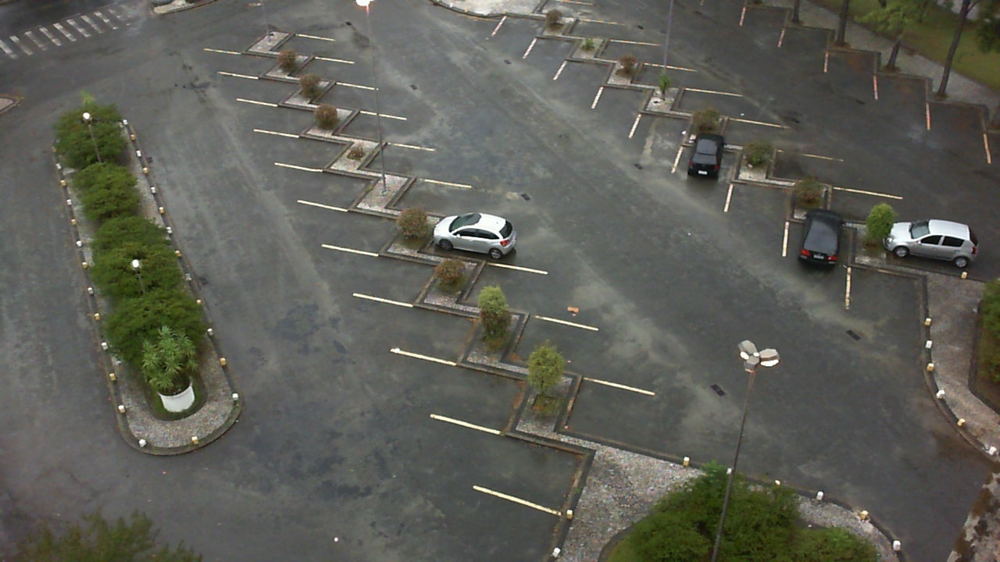

In [28]:
from PIL import Image
og_test_image = dataset["test"][16]["image"]
og_test_image

In [29]:
normalize = transforms.Normalize(mean=ADE_MEAN, std=ADE_STD)

# Assuming og_test_image is a PIL image or NumPy array
test_image = VF.to_tensor(og_test_image)  # [C, H, W]
test_image = VF.resize(test_image, (448, 448), interpolation=InterpolationMode.BILINEAR)
pixel_values = normalize(test_image).unsqueeze(0)  # [1, C, H, W]

print(pixel_values.shape)

torch.Size([1, 3, 448, 448])


In [30]:
# forward pass
with torch.no_grad():
  outputs = model(pixel_values.to(device))

In [31]:
upsampled_logits = torch.nn.functional.interpolate(outputs.logits,
                                                   size=og_test_image.size[::-1],
                                                   mode="bilinear", align_corners=False)
predicted_map = upsampled_logits.argmax(dim=1)

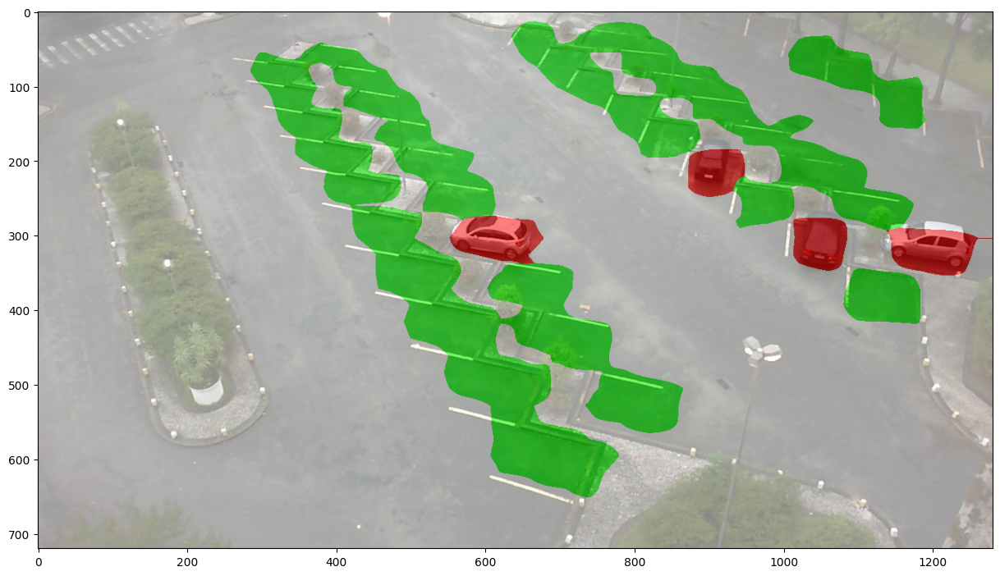

In [32]:
visualize_map(og_test_image, predicted_map.squeeze().cpu())

In [33]:
torch.save(model, 'model_pklot.pt')

In [34]:
# === Testing Cell: Compute Full Evaluation Metrics ===

from torchmetrics.classification import MulticlassF1Score, MulticlassRecall, MulticlassPrecision
from torchmetrics import Accuracy, JaccardIndex, MeanMetric
from tqdm.auto import tqdm
import torch

# Ensure model is in eval mode and on correct device
model.eval()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

num_classes = len(id2label)

# === Define Test Metrics ===
f1_metric = MulticlassF1Score(num_classes=num_classes, average='macro').to(device)
recall_metric = MulticlassRecall(num_classes=num_classes, average='macro').to(device)
precision_metric = MulticlassPrecision(num_classes=num_classes, average='macro').to(device)
accuracy_metric = Accuracy(task='multiclass', num_classes=num_classes).to(device)
mean_iou_metric = JaccardIndex(task='multiclass', num_classes=num_classes).to(device)
loss_metric = MeanMetric().to(device)

# Optional: Store values for visualization later
test_loss_list, test_iou_list, test_acc_list, test_f1_list = [], [], [], []
test_recall_list, test_precision_list = [], []

# === Evaluation Loop ===
with torch.no_grad():
    for batch in tqdm(test_dataloader, desc="Testing"):
        pixel_values = batch["pixel_values"].to(device)
        labels = batch["labels"].to(device)

        outputs = model(pixel_values, labels=labels)
        logits = outputs.logits
        loss = outputs.loss
        predicted = logits.argmax(dim=1)

        f1_metric.update(predicted, labels)
        recall_metric.update(predicted, labels)
        precision_metric.update(predicted, labels)
        accuracy_metric.update(predicted, labels)
        mean_iou_metric.update(predicted, labels)
        loss_metric.update(loss)

# === Compute Final Metrics ===
f1 = f1_metric.compute()
recall = recall_metric.compute()
precision = precision_metric.compute()
mean_iou = mean_iou_metric.compute()
mean_accuracy = accuracy_metric.compute()
avg_loss = loss_metric.compute()

# Save for visualization later
test_loss_list.append(avg_loss.item())
test_iou_list.append(mean_iou.item())
test_acc_list.append(mean_accuracy.item())
test_f1_list.append(f1.item())
test_recall_list.append(recall.item())
test_precision_list.append(precision.item())

# === Print Results ===
print("\n🧪 Test Results:")
print(f"Loss: {avg_loss:.4f}")
print(f"Mean IoU: {mean_iou:.4f}")
print(f"Mean Accuracy: {mean_accuracy:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"Recall: {recall:.4f}")
print(f"Precision: {precision:.4f}")


Testing: 100%|██████████| 1242/1242 [06:21<00:00,  3.26it/s]


🧪 Test Results:
Loss: 0.0843
Mean IoU: 0.8645
Mean Accuracy: 0.9664
F1 Score: 0.9258
Recall: 0.9274
Precision: 0.9243


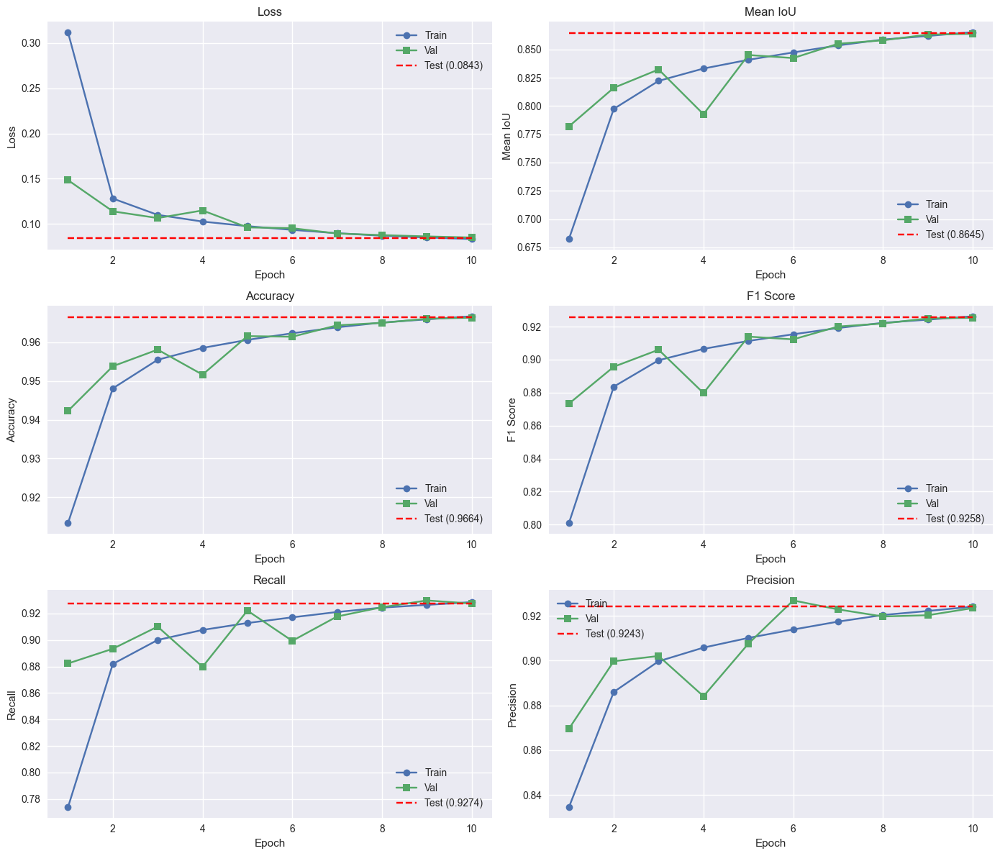

In [35]:
# === Visualization Cell: Plot Training, Validation, and Test Metrics ===

import matplotlib.pyplot as plt

# === Plot Config ===
plt.style.use("seaborn-v0_8")
epoch_range = range(1, epochs + 1)

# === Metric Dictionary ===
metrics = {
    "Loss": (train_loss_list, val_loss_list, test_loss_list),
    "Mean IoU": (train_iou_list, val_iou_list, test_iou_list),
    "Accuracy": (train_acc_list, val_acc_list, test_acc_list),
    "F1 Score": (train_f1_list, val_f1_list, test_f1_list),
    "Recall": (train_recall_list, val_recall_list, test_recall_list),
    "Precision": (train_precision_list, val_precision_list, test_precision_list)
}

# === Plot All Metrics ===
fig, axs = plt.subplots(nrows=3, ncols=2, figsize=(14, 12))
axs = axs.flatten()

for i, (name, (train_vals, val_vals, test_vals)) in enumerate(metrics.items()):
    axs[i].plot(epoch_range, train_vals, label="Train", marker="o")
    axs[i].plot(epoch_range, val_vals, label="Val", marker="s")
    axs[i].hlines(test_vals[-1], xmin=1, xmax=epochs, colors="r", label=f"Test ({test_vals[-1]:.4f})", linestyles="dashed")
    axs[i].set_title(name)
    axs[i].set_xlabel("Epoch")
    axs[i].set_ylabel(name)
    axs[i].legend()
    axs[i].grid(True)

plt.tight_layout()
plt.show()
